# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.17.1 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When i'm sitting at a cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we are using is from Kaggle's dog breed identification competition

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each text image

Submissions are evaluated on Multi Class Log Loss between the predicted probability and the observed target.

Multi-Class Log Loss, also known as cross-entropy loss or log loss, is a widely used performance metric for evaluating classification models with multiple classes. It measures the dissimilarity between predicted probabilities and actual class labels.

Mathematical Formulation
Log_loss = -(1/N) * sum(y_true * log(y_pred))

The objective is to minimize this loss function, thereby improving the accuracy and reliability of the classification model.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Feature

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Unzip the uploaded data into Google Drive
!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"    # -d stands for destination

Se truncaron las últimas líneas 5000 del resultado de transmisión.
  inflating: drive/MyDrive/Dog Vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: drive/MyDrive/Dog Vision/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: drive/M

### Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
# Import TensorFlow
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.17.1


In [ ]:
# Import TensorFlow Hub
import tensorflow_hub as hub
print("Hub version:", hub.__version__)

Hub version: 0.16.1


In [ ]:
# Check for GPU
print("GPU", "available!" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


## Getting our data ready (turning our data into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representation).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


There are 10222 unique ids and there are 120 unique breeds. And that's how the id and breed columns look like, it is showing the first 5 rows.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
brabancon_griffon,67
komondor,67


<Axes: xlabel='breed'>

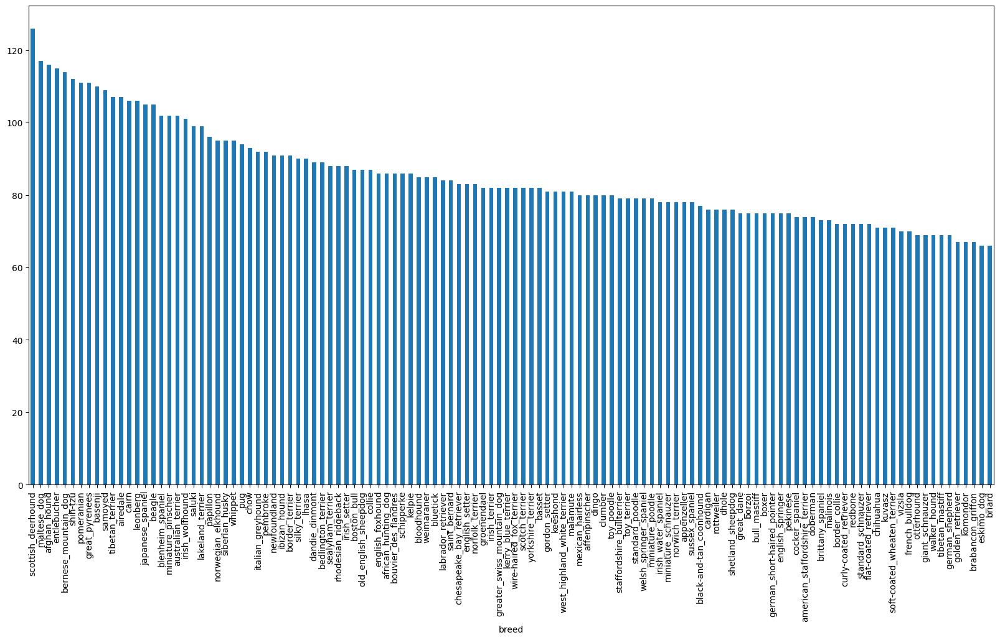

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

The graphics shows the numbers of images each breed has. If we only had only three images of eskimo dog, we could imagine our machine learning model might do very well at figuring out what a scottish_deerhound looks like because it has so many examples, but as for an eskimo dog, if there's only three images, it's probably going to be a bit hard to figure out what it looks like.

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

Google says that for each label you must have at least 10 images, each with at least one annotation (bounding box and the label)

However, for model training purposes, Google says it's recommended you use about 100 annotations per label.

In our data set there are about 75 to 85 images per class, it is pretty well spread out.

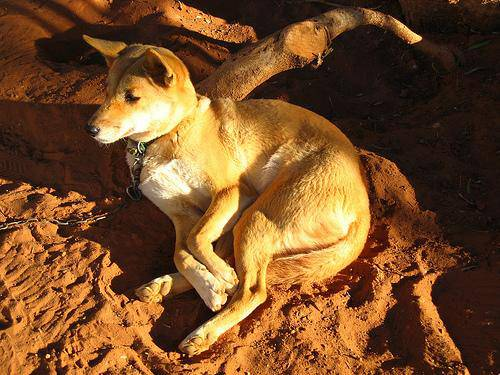

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


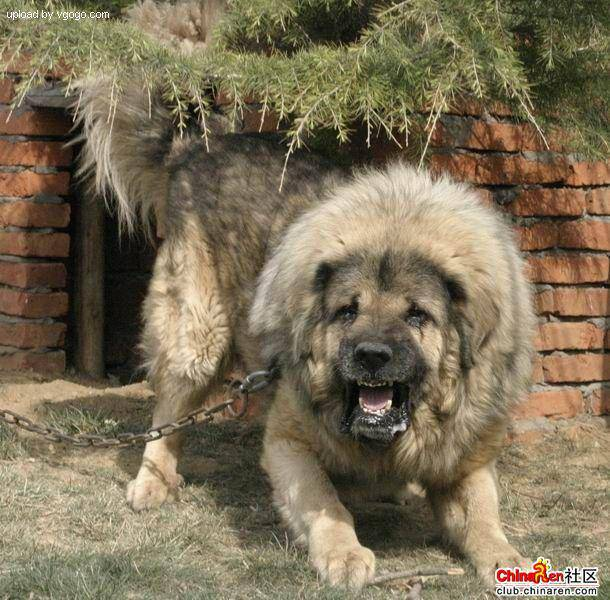

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels

,breed
0,boston_bull
1,dingo
2,pekinese
3,bluetick
4,golden_retriever
...,...
10217,borzoi
10218,dandie_dinmont
10219,airedale
10220,miniature_pinscher


In [ ]:
labels = labels_csv["breed"].to_numpy()    # convert it to a numpy array
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
labels = np.array(labels)    # it does the same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not matches number of filenames!")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Retorna un vector que contiene todos valores False excepto en las posiciones donde aparece
# boston_bull, en donde aparecerán los valores True.

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0]))    # index where label occurs
print(boolean_labels[0].argmax())    # index where label occurs in boolean array
print(boolean_labels[0].astype(int))    # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

It's a good a idea to start working with a portion of the filenames first to make sure things are working before we go and train a machine learning model on all of them.


We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:2], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

In [ ]:
# X values are the file paths to our images and Y values,
# the labels, are boolean numpy representations of the labels

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input.
2. Use Tensorflow to read the file and save it to a variable,  `image`.
3. Turn our `image` (a jpg) into Tensors.
4. Resize the `image`to be a shape of (224, 224).
5. Return the modified `image`.

Before we do, let's see what importing an image looks like.


In [ ]:
# Convert an image to a NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape
# Tensors are very similar to multi dimensional numpy array or matrices

(257, 350, 3)

In [ ]:
# height, width, color channel (RGB)
# each pixel in an image is some combination of red, green and blue, and they range from 0 to 255

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
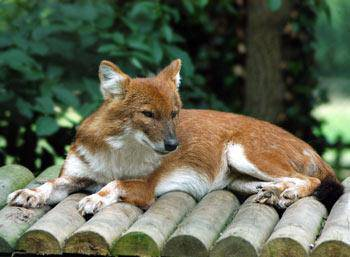

In [ ]:
image

In [ ]:
image.min(), image.max()

(0, 255)

In [ ]:
image[:2]    # This is a numpy ndarray

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# Turn image into a tensor
tf.constant(image)
# Creates a constant tensor from a tensor-like object.


<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
# This is a tensor, and now is able to run on a GPU, so a lot faster than a CPU (we've seen an example that GPU runs 30X faster than CPU)

array([[[178, 165, 131],
        [179, 166, 132],
        [182, 167, 134],
        ...,
        [ 59,  45,  36],
        [ 52,  39,  30],
        [ 39,  29,  19]],

       [[176, 163, 129],
        [178, 165, 131],
        [180, 165, 132],
        ...,
        [ 61,  47,  38],
        [ 54,  41,  32],
        [ 41,  31,  21]],

       [[175, 162, 130],
        [176, 163, 131],
        [179, 164, 131],
        ...,
        [ 63,  49,  40],
        [ 55,  42,  33],
        [ 44,  34,  24]],

       ...,

       [[117, 112,  93],
        [124, 119, 100],
        [136, 129, 111],
        ...,
        [128, 100,  78],
        [146, 119,  98],
        [165, 139, 126]],

       [[125, 120, 101],
        [128, 123, 104],
        [136, 129, 111],
        ...,
        [142, 114,  92],
        [157, 130, 109],
        [170, 144, 131]],

       [[134, 129, 110],
        [135, 130, 111],
        [139, 132, 114],
        ...,
        [149, 121,  99],
        [161, 134, 113],
        [165, 139, 126]]], dtype=uint8)
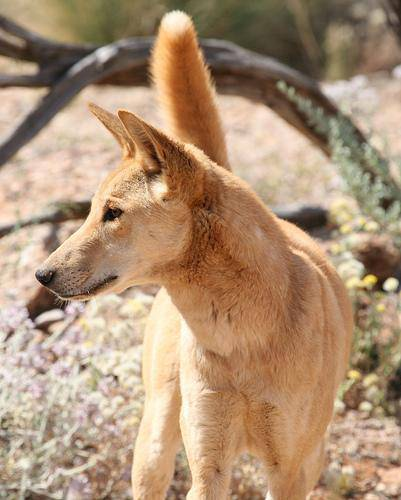

In [ ]:
image2 = imread(filenames[43])
image2

In [ ]:
image2[:3]    # this is an array

array([[[178, 165, 131],
        [179, 166, 132],
        [182, 167, 134],
        ...,
        [ 59,  45,  36],
        [ 52,  39,  30],
        [ 39,  29,  19]],

       [[176, 163, 129],
        [178, 165, 131],
        [180, 165, 132],
        ...,
        [ 61,  47,  38],
        [ 54,  41,  32],
        [ 41,  31,  21]],

       [[175, 162, 130],
        [176, 163, 131],
        [179, 164, 131],
        ...,
        [ 63,  49,  40],
        [ 55,  42,  33],
        [ 44,  34,  24]]], dtype=uint8)

In [ ]:
# Turn image2 into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input.
2. Use Tensorflow to read the file and save it to a variable,  `image`.
3. Turn our `image` (a jpg) into Tensors.
4. Resize the `image`to be a shape of (224, 224).
5. Return the modified `image`.

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path) # Reads the contents of file. This operation returns a tensor with the entire contents of the input filename.
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values to from 0 to 255 to 0-1 values (Normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)   # convert image to dtype, scaling its values if needed
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

TensorFlow likes to see things in the form of a data batch, that is to say, a tensor containing an image example or a piece of data example. So it likes it in the form of give me a piece of data and its label as a combined tensor so I can process it really fast.

A batch, is also called a mini batch, that is to say, is a small portion of your data. The default batch size is generally 32 with most deep learning models. It is demonstrated that the rate of learning of the deep neural network reaches its best performance if the number of samples per batch is m=32: https://arxiv.org/abs/1804.07612

## Turning our data into batches

We're just taking a small portion, 32 images and calculating on those 32 images at on time. And then, the next loop, the next training session, we calculate on the next 32. Because if we try to calculate patterns in all 10,000 images, Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory. A GPU, although it's really fast to computing, it still has a limited amount of memory.

So that's why we do about 32 images (this is the batch size) at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)` <- we pass 32 at a time to our machine learning model, img is in tensor format, and it's going to fing the pattern in this image that relate to this label, and then it will end up doing that in a sort of loop fashion until it gets through all 10,000+ images



In [ ]:
# Create a simple function to return a tuple of tensors of the form (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demonstration of the above
(process_image(X[42], tf.constant(y[42])))    # (data in the form of tensor, label in the form of tensor)

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

In [ ]:
# So now we've got a tuple of an image and a label pair, in the form of tensors. a tuple of tensors.

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches ! # READ THROUGH THE DOCUMENTATION

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels)
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))   # only pathfiles (no labels)
    # we're making a batch dataset. Creates a Dataset whose elements are slices of the given tensors.
    # I'm going to create a tensorflow (tf) dataset, from the tensor slices, X, and because we're passing X to tf.constant()
    # it turns X into a tensor.
    data_batch = data.map(process_image).batch(BATCH_SIZE)    # Take the tf dataset made of X (which is filenames in the form of tensors) and then map our process image f(x)
    return data_batch                                         # it executes all the instructions of f(X), and then turn it into a batch of BATCH_SIZE

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths     # it says "pass me some tensors and i'll create some Dataset out of that"
                                               tf.constant(y))) # labels    # because we are passing to tf.constat() it turns X into a tensor
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),     # image filepaths
                                               tf.constant(y)))    # labels # we pass it a tuple of (X, y) in the form of tensor both
    # Shuffling pathnames and labels befor mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))    # It shuffles the 10222 images..
                                               # buffer_size it stans for how many variables we want to shuffle, we want to shuffle it up all the variables
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

# process_image let us process the img if we have no labels
# if we have labels we can use the function get_image_label

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),\
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)) This is our training data\

  (None, 224, 224, 3) this is our image, None is for batchsize (32 by default) and it has a shape of img_height=224, img_width=224, and number_channels=3 (r,g,b)

TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)) These are image label pairs in the form of tensors, and our labels also have a batch shape of None, and they have a dimension of 120, because there's a 120 dog breeds.


In [ ]:
y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

break down the function and check what it does line by line to understand its behavior.

### Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (num_rows=5, num_columns=5, index=i+1)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])    # we want to show the ith image
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    plt.tight_layout()
    # Turn the grid lines off
    plt.axis("off")


In [ ]:
train_data  # because train_data is in the form of a batch we need to turn it into an iterator, so we can de-batch the training data and work with just one bat paso
            # and we can do that by calling the function as_numpy_iterator(), this is going to take our batch dataset and it's going to unwind it from a batch and
            # turn it into a numpy iterator (de modo que podamos recorrer iterador paso a paso a fin de obtener lotes de datos.. doy un paso y obtengo un lote de 32
            # imagenes, doy otro paso y obtengo otro lote de 32 imagenes y asi sucesivamente.)

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator()) # Returns an iterator which converts all elements of the dataset to numpy, into an array (iterable)
train_images, train_labels    # next: takes the batch from the top, it returns the next item of an iterators
                              # and then thanks to next, it's going to grab the first batch of the top of this out iterator.
                              #and the because it splits it (train_images, train_labels)
                              # is going to assign TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None) to train_images and
                              # is going to assign TensorSpec(shape=(None, 120), dtype=tf.bool, name=None) to train_labels

(array([[[[2.56216884e-01, 2.75824726e-01, 2.87589431e-01],
          [2.69639760e-01, 2.89247602e-01, 3.01012307e-01],
          [2.61818379e-01, 2.81426221e-01, 2.93190926e-01],
          ...,
          [2.82037854e-01, 2.66981781e-01, 2.23529428e-01],
          [2.59418815e-01, 2.51575679e-01, 1.99404746e-01],
          [2.68172324e-01, 2.60329187e-01, 2.01505676e-01]],
 
         [[3.30349416e-01, 3.49957258e-01, 3.61721963e-01],
          [3.68306309e-01, 3.87914151e-01, 3.99678856e-01],
          [3.09068859e-01, 3.28676701e-01, 3.40441406e-01],
          ...,
          [2.78427869e-01, 2.63371825e-01, 2.19919458e-01],
          [2.59462595e-01, 2.51619458e-01, 1.99448511e-01],
          [2.68216103e-01, 2.60372967e-01, 2.01549441e-01]],
 
         [[2.37023801e-01, 2.56631643e-01, 2.68396348e-01],
          [1.88503221e-01, 2.08111078e-01, 2.19875783e-01],
          [2.50396997e-01, 2.70004839e-01, 2.81769544e-01],
          ...,
          [2.75644898e-01, 2.60588825e-01, 2.1713

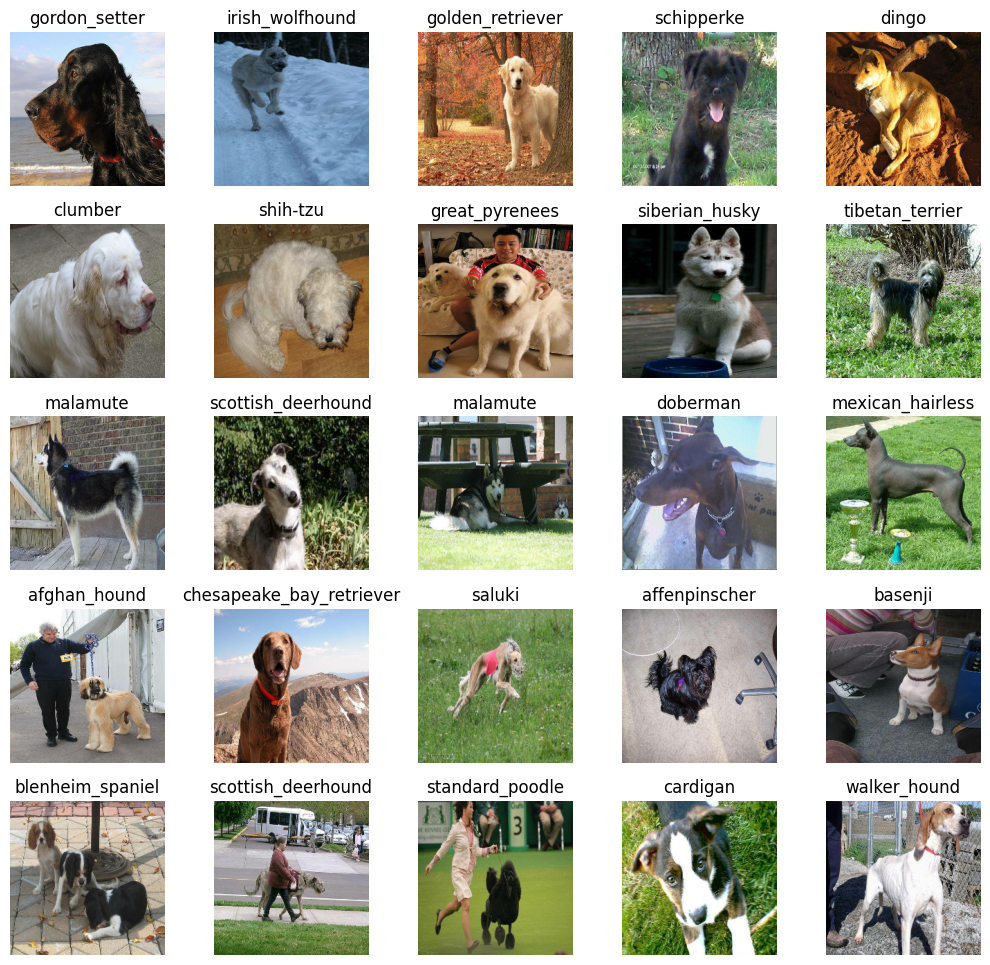

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

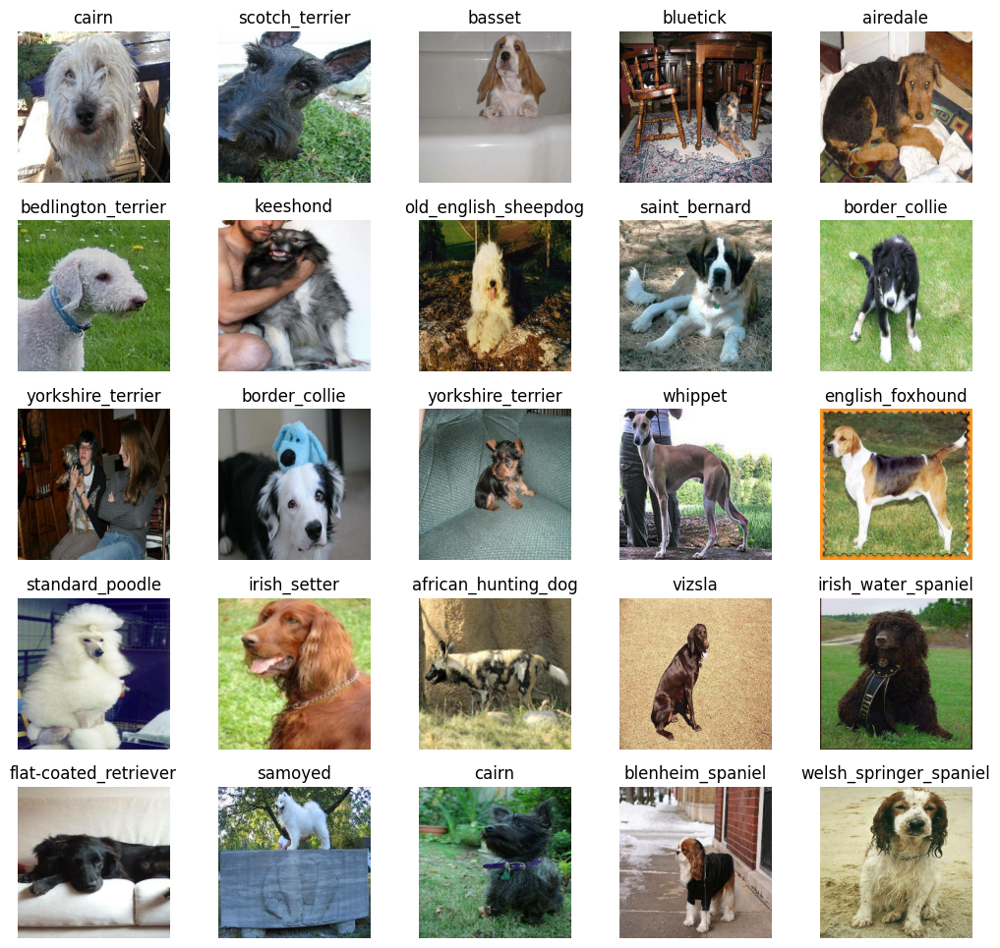

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of tensors) to our model.
* The output shape (images labels, in the form of tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

We're going to take what a machine learning model has learned and apply it to our problem, saves us on energy, cost and time.

In [ ]:
# Setup input shape to the model (in the form of tensors of our model)
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]    # batch, img_height, img_width, colour_channels

# Setup the output shape of our model (in the form of tensors of our model)
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"  # of the model we want to use, to start experimenting as quick as possible
# https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, the output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion
(do this first, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  hubs_layer = hub.KerasLayer(MODEL_URL)

  # Setup the model layers
  model= tf.keras.Sequential([    # we're passing to Keras' Sequential model an input (img of the dog)
    tf.keras.layers.Lambda(lambda x: hubs_layer(x)),   # Layer 1 (input layer)  # and the model Net V2 (MODELURL). it's going to fing the patterns in img
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,    # hey, we don't want the same shape as mobile Net V2, we rather convert it to OUTPUT_SHAPE
                          activation="softmax")    # Layer 2 (output layer)                          # (amount of uniq labels that we have)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),   # height of the hill, the goal is to minimize the loss, the higher the loss the worse the prediction
      optimizer=tf.keras.optimizers.Adam(),    # It tells you how to lower the loss function. it helps the model to improve its guesses
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda_3 (Lambda)                    │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

It figures out the patterns in the images for us, the features and its values.

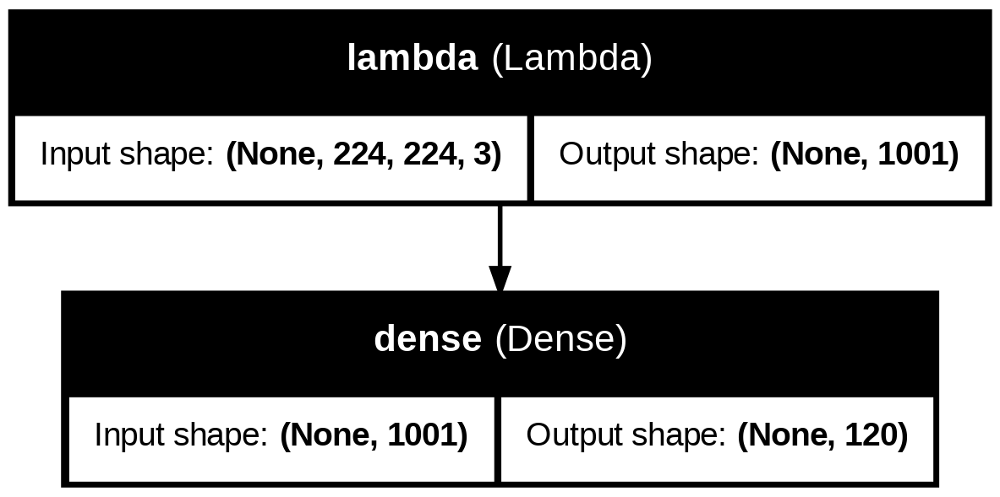

In [ ]:
from tensorflow.keras.utils import plot_model

# generate a graph of the nodes and links of a neural network created with TensorFlow and Keras
plot_model(model, to_file='modelo.png', show_shapes=True, show_layer_names=True)

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training eartly if a model stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/Callback

We'll create two callbacks, one for TensorBoard (is like a dashboard for seeing how well your model is doing) which helps track our models progress (seeing the loss function is getting reduced and that the accuracy is going up) and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard magic` function (we'll do this after model training)

In [ ]:
# Load Tensor Board notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  """
  Helps us to track the performance of our model and compare it to others.
  """
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so the log get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S%"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping



In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100   #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still runniing on a GPU
print("GPU", "available!!" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


Let's create a function which trains a model

* Create a model using `create_model()`
* Setup TensorBoard callback using `create_tensorboard_callback`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS)` and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train a return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 33s 774ms/step - accuracy: 0.0613 - loss: 5.1007 - val_accuracy: 0.2850 - val_loss: 3.4306
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 19s 184ms/step - accuracy: 0.6145 - loss: 1.8912 - val_accuracy: 0.5400 - val_loss: 2.1204
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 178ms/step - accuracy: 0.9257 - loss: 0.6199 - val_accuracy: 0.5900 - val_loss: 1.6767
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 228ms/step - accuracy: 0.9875 - loss: 0.2577 - val_accuracy: 0.6550 - val_loss: 1.4759
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 9s 180ms/step - accuracy: 0.9962 - loss: 0.1613 - val_accuracy: 0.6450 - val_loss: 1.3718
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 244ms/step - accuracy: 0.9994 - loss: 0.1060 - val_accuracy: 0.6650 - val_loss: 1.3258
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 208ms/step - accuracy: 1.0000 - loss: 0.0777 - val_accuracy: 0.6600 - val_loss: 1.2989
Ep

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?\
**Note:** Overfitting to begin with is a good thing! it means our model is learning!!!

### Checking the TensorBoard logs

The tensorboard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 505ms/step


array([[2.85294722e-03, 6.71342859e-05, 2.58138729e-03, ...,
        1.24385254e-03, 6.74486655e-05, 6.58053532e-03],
       [5.95543999e-03, 6.52882329e-04, 1.26090366e-02, ...,
        3.40078282e-03, 7.03897234e-03, 2.04153417e-04],
       [6.40146536e-05, 5.75610356e-05, 2.40608915e-05, ...,
        1.08927066e-04, 3.70763701e-05, 3.80611105e-04],
       ...,
       [3.74389265e-06, 8.85153131e-05, 3.87163709e-05, ...,
        7.00912869e-06, 1.19295320e-04, 1.06364445e-04],
       [6.48717210e-03, 7.65204895e-05, 2.53080390e-04, ...,
        8.94038705e-04, 9.21812607e-05, 1.43360952e-02],
       [5.67873241e-04, 1.30999426e-04, 2.07821358e-04, ...,
        9.91714653e-03, 1.79176102e-04, 7.75797380e-05]], dtype=float32)

In [ ]:
predictions[0]

array([2.85294722e-03, 6.71342859e-05, 2.58138729e-03, 3.63300751e-05,
       3.87444510e-04, 1.03399550e-04, 6.65963488e-03, 8.94277415e-04,
       7.26186263e-05, 2.80821300e-03, 2.28009958e-04, 2.97990831e-04,
       6.84032508e-04, 3.30126204e-04, 1.24611030e-03, 5.05277130e-04,
       1.79698793e-04, 7.06439614e-02, 2.61163877e-05, 8.70052463e-05,
       2.51394068e-03, 3.26559821e-04, 1.65871752e-04, 3.63305793e-03,
       1.72938453e-05, 4.12316498e-04, 4.95435208e-01, 1.50788313e-04,
       2.55321647e-04, 3.90697271e-04, 3.52698902e-04, 3.10308440e-03,
       7.10849999e-04, 7.15403803e-05, 1.38090996e-04, 1.85120944e-02,
       3.89652596e-05, 2.96761136e-04, 3.82009457e-04, 8.47161718e-05,
       7.64673459e-04, 5.03072515e-05, 5.07388962e-04, 1.05069589e-03,
       1.75950045e-05, 1.51067114e-04, 1.13299538e-04, 1.60374097e-04,
       4.68715141e-03, 3.87160435e-05, 3.16145190e-04, 4.92167419e-05,
       2.40607274e-04, 4.13864938e-04, 3.20147403e-04, 7.72036874e-05,
      

In [ ]:
# First prediction
index=42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Prediction label: {unique_breeds[np.argmax(predictions[index])]}")

[8.69039504e-05 1.42146266e-04 4.19095049e-05 8.38510314e-05
 2.90415529e-03 6.89227527e-05 1.23307938e-04 1.90954737e-03
 3.20787095e-02 2.92620435e-02 9.37607765e-05 1.01618563e-04
 3.30403855e-04 1.24070246e-03 2.87698960e-04 7.40575430e-04
 2.23704155e-05 4.11139161e-04 2.54866492e-04 9.40777536e-05
 7.51061089e-05 3.78628407e-04 2.13929845e-04 6.46329863e-05
 1.54060973e-02 2.69792014e-04 1.25623283e-05 8.91857708e-05
 3.02625675e-04 1.97872767e-04 2.52212249e-05 1.49998130e-04
 1.33057227e-04 3.66359236e-05 9.78112002e-05 3.26119625e-05
 3.24054068e-04 7.90243939e-05 5.62273126e-05 1.69720814e-01
 7.25793361e-05 5.99963096e-05 3.69556760e-03 7.03403657e-06
 6.06753383e-05 2.38247667e-05 1.50636202e-04 1.27231251e-04
 1.42519159e-04 3.55467200e-04 9.34235723e-05 2.49015837e-04
 2.25616022e-04 1.56213937e-03 1.18569105e-05 2.84576148e-04
 1.76670394e-04 1.74424218e-04 1.22326179e-04 6.92805916e-05
 1.22999743e-04 1.65527992e-04 1.27979602e-05 4.37144772e-05
 9.20312305e-05 1.743118

In [ ]:
# this is an array of prediction probabilities
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.


In [ ]:
# Turn prediction probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (true labels)

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to predicted label.
* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]    # n-th sample

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be rpedicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)


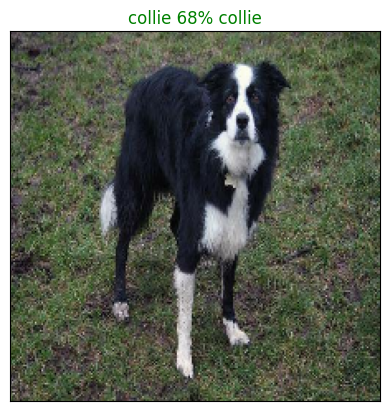

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=43)    # number of picture to predict PROBA n=77

Now we've got one function to visualize our models top prediction, let's make another to viewe our models top 10 prediction.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction lables
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]   # ::-1 descending
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]     # obtiene las 10 probabilidades mas altas en orden decreciente
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values,
                    color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

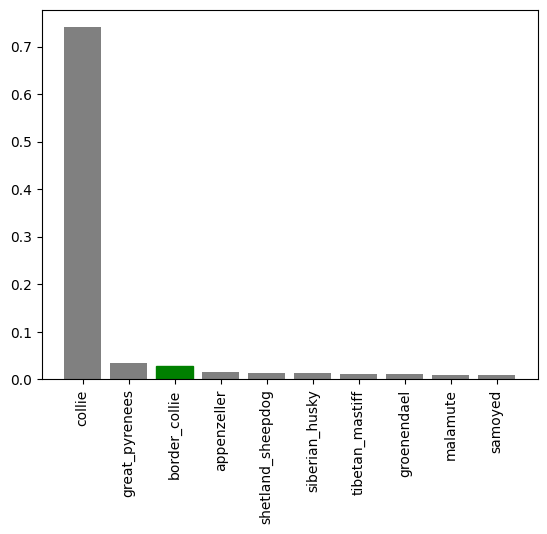

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

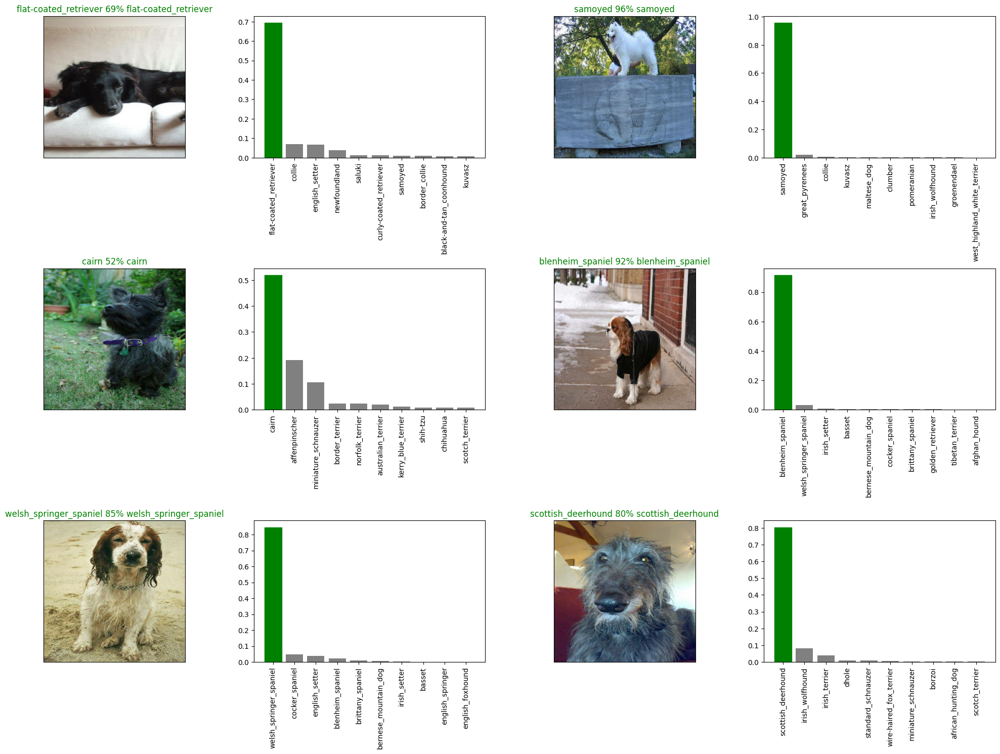

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows=3
num_cols=2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and reloading a model

We're going to follow the steps that are written in the documentation: https://www.tensorflow.org/tutorials/keras/save_and_load?hl=es-419

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"    # save format of model. h5 is just a file specification, an extension, like jpeg

  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  # given that we're not using the simples use case, we're using a TensorFlow hub model
  # we need to pass it this custom_objetcts dictrionary. We need to tell it, hey, we've got
  # an irregular layer, So a layer you wouldn't have seen before in our model (¿can you lend me the GPU, please? i want a decent job)
  return model

Now we've got functions to save and load a trained model, let's make sure they work.

In [ ]:
# name and route of where i'm going to save my model
model_save_path = "drive/MyDrive/Dog Vision/models/1000-images-mobilenetv2-Adam.keras"

# Guarda el modelo en formato TensorFlow (carpeta con múltiples archivos)
model.save(filepath=model_save_path)

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/1000-images-mobilenetv2-Adam.keras", safe_mode=False)

# according to the documentation: https://www.tensorflow.org/tutorials/keras/save_and_load?hl=es-419
# This may generate warnings related to saving the state of the optimizer.
# These warnings (and similar warnings throughout this notebook)
# are in place to discourage outdated usage, and can be ignored.


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 6 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 360ms/step - accuracy: 0.0019 - loss: 5.7288


[5.718796253204346, 0.004999999888241291]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

TypeError: Exception encountered when calling Lambda.call().

[1m'dict' object is not callable[0m

Arguments received by Lambda.call():
  • inputs=tf.Tensor(shape=(None, 224, 224, 3), dtype=float32)
  • mask=None
  • training=False

In [ ]:
# If all is well, this should return the exact same thing, the results of the loss function and the accuracy must be the exact same

## Training a big dog model 🐶 (on the full data)

In [ ]:
len(X), len(y)

In [ ]:
x[:10]

In [ ]:
X_train[:10]

In [ ]:
len(X_train)    # at the moment our model has trained with 800 images

In [ ]:
y[:2]    # y are the labels asociated with each file path

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# There is no validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note**

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 62s 169ms/step - accuracy: 0.4923 - loss: 2.3365
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - accuracy: 0.8924 - loss: 0.3820
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 80s 150ms/step - accuracy: 0.9479 - loss: 0.2173
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 87s 167ms/step - accuracy: 0.9681 - loss: 0.1473
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 87s 185ms/step - accuracy: 0.9832 - loss: 0.0989
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 79s 176ms/step - accuracy: 0.9903 - loss: 0.0709
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 67s 208ms/step - accuracy: 0.9917 - loss: 0.0551
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 55s 171ms/step - accuracy: 0.9956 - loss: 0.0414
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 59s 183ms/step - accuracy: 0.9972 - loss: 0.0316
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 180ms/step - accuracy: 0.9967 - loss: 0.0304
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 178ms/step - accuracy: 0.9988 - loss: 0.0224
Epoch 12

In [ ]:
# Save the model to .keras
model_save_path = "drive/MyDrive/Dog Vision/models/full-image-set-mobilenetv2-Adam.keras"
full_model.save(filepath=model_save_path)

In [ ]:
import tensorflow as tf

loaded_full_model = tf.keras.models.load_model("drive/MyDrive/Dog Vision/models/full-image-set-mobilenetv2-Adam.keras", safe_mode=False)

In [ ]:
len(X)

10222

## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Fortunately we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `true` (since the test data doesn't have).
* Make a predictions array by passing the test data batches to the  `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e7dc8cc599049ea9fa2a172c88646c57.jpg',
 'drive/MyDrive/Dog Vision/test/e7e9dd51302fe08c1c89a550e183cf07.jpg',
 'drive/MyDrive/Dog Vision/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 'drive/MyDrive/Dog Vision/test/e7ed96b272013c6de9505a753816ce75.jpg',
 'drive/MyDrive/Dog Vision/test/e7f95aabf775a636b3893ffa120adaf9.jpg',
 'drive/MyDrive/Dog Vision/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 'drive/MyDrive/Dog Vision/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 'drive/MyDrive/Dog Vision/test/e800b6c8d2904e205d67ada800907762.jpg',
 'drive/MyDrive/Dog Vision/test/e806a67a05289ac6de6831001664b81b.jpg',
 'drive/MyDrive/Dog Vision/test/e806fbb5ca4dd3a094f7819bd810cc65.jpg']

In [ ]:
# Filtrar archivos de imagen válidos
valid_extensions = (".jpg", ".jpeg", ".png")
test_filenames = [os.path.join(test_path, fname) for fname in os.listdir(test_path)
                  if fname.lower().endswith(valid_extensions)]

print(f"Total imágenes válidas encontradas: {len(test_filenames)}")

Total imágenes válidas encontradas: 10357


In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data    # we have to see the data in the form of tensor batches

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note**

In [ ]:
# Make predictions on test data batch using the loaded full model a gpu is collecting soil
test_predictions = full_model.predict(test_data,
                                      verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 372s 1s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]   # so these are all prediction probabilities for the 10,000 images

array([[1.20004393e-06, 4.93223684e-09, 7.55005392e-09, ...,
        2.26139538e-10, 2.45980709e-06, 4.69079069e-08],
       [7.78995163e-05, 1.09274207e-08, 3.35238615e-10, ...,
        9.92148408e-09, 1.13715339e-06, 9.88668978e-01],
       [6.12694029e-09, 2.62442373e-10, 2.62974131e-09, ...,
        2.66796141e-09, 1.74846071e-09, 1.06860054e-09],
       ...,
       [8.47015340e-12, 1.16226104e-12, 1.99052996e-10, ...,
        6.47370543e-05, 2.35481963e-08, 2.83359274e-12],
       [9.03153327e-16, 1.13718563e-07, 8.03159893e-13, ...,
        1.20930294e-10, 7.20816256e-13, 7.69398087e-12],
       [6.95016098e-08, 3.12152215e-09, 5.11892218e-09, ...,
        1.10537206e-08, 9.93142486e-01, 5.82517669e-06]])

In [ ]:
test_predictions.shape   # (10357 that's how many test images we have, and each one of them has 120 different prediction probabilities)

(10357, 120)

### Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probabilty outputs in a DataFrame with an ID and a column for each different dog breed.
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_filenames[:10]

['e7dc8cc599049ea9fa2a172c88646c57.jpg',
 'e7e9dd51302fe08c1c89a550e183cf07.jpg',
 'e7e9624f2a2e61ab187358f5968bfde8.jpg',
 'e7ed96b272013c6de9505a753816ce75.jpg',
 'e7f95aabf775a636b3893ffa120adaf9.jpg',
 'e7fcdf9671a6593b638cbee42842f981.jpg',
 'e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 'e800b6c8d2904e205d67ada800907762.jpg',
 'e806a67a05289ac6de6831001664b81b.jpg',
 'e806fbb5ca4dd3a094f7819bd810cc65.jpg']

In [ ]:
# Append test image ID's to predictions DataFrame
import os

# Definir extensiones válidas
valid_extensions = (".jpg", ".jpeg", ".png")

# Filtrar archivos válidos (que terminan con extensiones válidas) y eliminar la extensión
test_ids = [os.path.splitext(fname)[0] for fname in os.listdir(test_path)
            if fname.lower().endswith(valid_extensions) and os.path.isfile(os.path.join(test_path, fname))]

# Mostrar los primeros 3 resultados
test_ids[:3]

['e7dc8cc599049ea9fa2a172c88646c57',
 'e7e9dd51302fe08c1c89a550e183cf07',
 'e7e9624f2a2e61ab187358f5968bfde8']

In [ ]:
# Now we need to just append all of our prediction probabilities for each dog breed

preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
len(preds_df)

0

In [ ]:
# add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,NaN,1.200044e-06,4.932237e-09,7.550054e-09,2.121890e-10,1.784815e-07,6.475801e-09,5.057845e-10,1.398505e-08,1.918591e-11,...,3.886236e-08,2.057918e-09,5.140437e-09,8.714159e-09,6.360985e-09,6.511657e-09,1.169686e-06,2.261395e-10,2.459807e-06,4.690791e-08
1,NaN,7.789952e-05,1.092742e-08,3.352386e-10,1.994867e-07,1.228290e-07,4.340721e-09,9.733995e-03,2.240246e-08,9.416765e-11,...,4.625455e-08,6.331479e-04,1.511302e-09,1.047117e-10,5.256161e-09,2.556210e-10,3.476654e-06,9.921484e-09,1.137153e-06,9.886690e-01
2,NaN,6.126940e-09,2.624424e-10,2.629741e-09,1.647627e-11,4.970303e-08,4.008105e-08,8.548744e-11,2.870102e-08,4.222999e-08,...,1.591846e-08,2.804802e-09,2.453631e-08,5.757353e-09,9.228669e-11,4.654697e-06,8.272075e-09,2.667961e-09,1.748461e-09,1.068601e-09
3,NaN,6.546752e-08,9.739623e-09,1.727194e-10,8.117414e-07,3.089173e-07,7.155576e-11,9.863178e-01,7.441173e-08,1.722905e-08,...,2.086843e-07,1.386205e-06,8.974894e-08,6.183163e-09,1.159683e-09,1.709631e-08,6.235586e-08,2.590222e-09,8.308930e-07,5.527209e-03
4,NaN,5.803897e-01,8.561987e-10,4.602508e-09,6.744583e-11,2.669135e-08,1.379692e-10,1.172276e-07,2.270507e-09,3.626432e-10,...,2.822242e-05,1.704695e-08,4.001798e-08,1.416189e-08,3.829665e-08,1.883781e-10,4.154783e-10,6.813035e-10,3.812574e-08,6.397329e-05


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Make predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
have labels, we set the test data to `True`.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels,\
`test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.


In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/dog-photos/"
custom_images_paths = [custom_path + fname for fname in os.listdir(custom_path)
if os.path.isfile(os.path.join(custom_path, fname))]

In [ ]:
custom_images_paths

['drive/MyDrive/Dog Vision/dog-photos/dog-1.jpg',
 'drive/MyDrive/Dog Vision/dog-photos/dog-2.jpg',
 'drive/MyDrive/Dog Vision/dog-photos/dog-3.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_images_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# our custom images should be in tensors now.

In [ ]:
# Make predictions on the custom data
custom_preds = full_model.predict(custom_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


In [ ]:
custom_preds.shape   # (we've got 3 images, with 120 prediction probabilities for each one)

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]    # each one get the pred labels
custom_pred_labels

['golden_retriever', 'lakeland_terrier', 'french_bulldog']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():    # this is going to unwind our data batch
   custom_images.append(image)

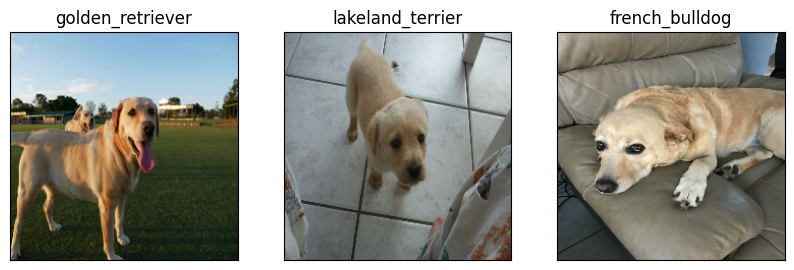

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):   # enumerate is going to go for the images in custom images, count them up, save the count
  plt.subplot(1, 3, i+1)                    # of it to the variable i, and save the image inside custom_images to the variable image
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)